# WSe$_2$

We continue with the DFT calculation of WSe$_2$. The three band model {cite}`three_band` tells us that we need to include SOC so we cannot use the standard pseudopotentials of the [materialscloud](https://www.materialscloud.org/discover/sssp/table/efficiency). {cite}`SSSP` Instead we take a relativistic potentials from the [pslibrary](https://dalcorso.github.io/pslibrary/) compiled by Andrea Dal Corsa. {cite}`pslibrary`

In [1]:
import plotly.graph_objects as go
import numpy as np
from myst_nb import glue
from moire.lattice import Lattice
from moire.bandstructure import BandStructure
from moire.dft import DFT
import numpy as np

In [2]:
W_dic = dict(name='W', color='red', draw_radius=40, key= 'W', pseudo_potential='pslibrary.1.0.0/rel-pbe/PSEUDOPOTENTIALS/W.rel-pbe-spn-rrkjus_psl.1.0.0.UPF', weight=183.840, projections=['dxy', 'dz2', 'dx2-y2'])
Se_dic = dict(name='Se', color='blue', draw_radius=30, key='Se', pseudo_potential='pseudo/Se_pbe_v1.uspp.F.UPF', weight=78.960)

wse2_lat = Lattice(3.325)
wse2_lat.set_atom([0, 0], W_dic)
wse2_lat.set_atom([0, 1.919689645, 1.67871166], Se_dic)
wse2_lat.set_atom([0, 1.919689645, -1.67871166], Se_dic)

In [36]:
work_dir = '/home/hidde/hidde/Unige/dft/wse2'
data_dir = '/home/hidde/hidde/Unige/Hidde-Dijkstra.github.io/dft_data/'
wse2 = DFT('wse2', work_dir, data_dir)

control_dic = dict(pseudo_dir='../')
system_dic = dict(occupations='fixed',  ecutwfc=30, nbnd=36, lspinorb=True, noncolin=True)
QE = wse2.prepare_qe({'&CONTROL': control_dic, '&SYSTEM': system_dic}, wse2_lat)
PROJWFC = wse2.prepare_projwfc('projwfc')
wse2.set_k_grid(8)
wse2.set_k_path([(0, 0, 0), (0.5, 0, 0), (1/3, 1/3, 0), (0, 0, 0)], ["Γ", "M", "K", "Γ"], 100)

In [4]:
write_qe = 0
run_scf = 0
run_bands = 0
run_nscf = 0
projwfc = 0

if write_qe:
    for file_type in ['scf', 'nscf', 'bands']:
        QE.write(file_type)
if run_scf:
    QE.run('scf')
if run_bands:
    QE.run('bands')
    QE.extract(task='bands')
if run_nscf:
    QE.run('nscf')
if projwfc:
    PROJWFC.write()
    PROJWFC.run()
    PROJWFC.extract()

## Monolayer

The input files for QE are largely the same as for graphene. The main difference is in the `&SYSTEM` card:

::::{panels}
scf `&SYSTEM` input
^^^
```
&SYSTEM
  assume_isolated = '2D'
  ibrav = 4
  nat = 3
  ntyp = 2
  occupations = 'fixed'
  ecutwfc = 30
  nbnd = 36
  lspinorb = true
  noncolin = true
  a = 3.325
  c = 32
/
```
---
Description
^^^
We add two new arguments to the `&SYSTEM` card for the `scf`, `nscf` and `bands` calculations: `lspinorb` and `noncolin`. The first tells QE that at least one of pseudopotentials has SOC whereas the second tells QE to include relativistic effects. We changed `occupations` to `fixed` since WSe$_2$ is an insulator.
::::

```{figure} logo.png
---
height: 0px
name: wse2_qe_bandstructure
figclass: margin
---
QE bandstructure of WSe$_2$ with the bands from the TB Hamiltonian of the three band model included. {cite}`three_band` Clearly the model is fitted to the K point and valence $\Gamma$ point.
```

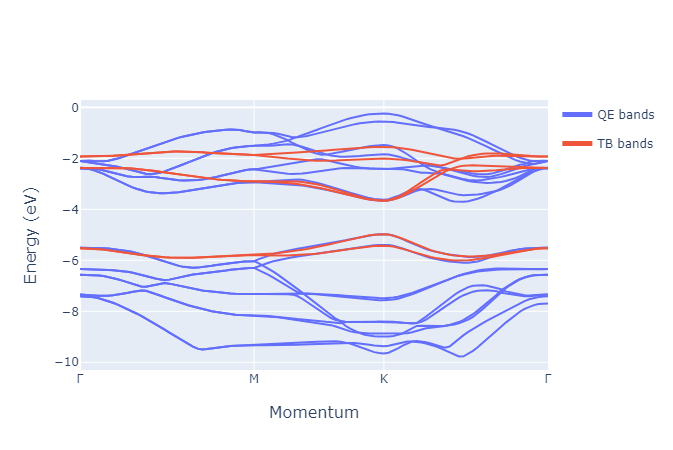

In [5]:
wse2_var_dic = {
        "t_1": 0.034, 
        "t_2": 0.263, 
        "t_3": -0.207, 
        "t_12": 0.329, 
        "t_13": 0.486, 
        "t_23": 0.457, 
        "ε_1": 2.179, 
        "ε_3": 0.942, 
        "λ_SOC": 0.228
    }

def H_mono(k, σ=0, **kwargs):
    t_1, t_2, t_3, t_12, t_13, t_23, ε_1, ε_3, λ_SOC = wse2_var_dic.values()
    k_x, k_y = k[0]/2, k[1]*np.sqrt(3)/2
    cos2x, cosx, cosy = np.cos(2*k_x), np.cos(k_x), np.cos(k_y)
    sin2x, sinx, siny = np.sin(2*k_x), np.sin(k_x), np.sin(k_y)
    h_1 = 2*t_1*cos2x + (t_1+3*t_2)*cosx*cosy
    h_2 = 2*t_2*cos2x + (t_2+3*t_1)*cosx*cosy
    h_3 = 2*t_3*cos2x + 4*t_3*cosx*cosy
    h_12 = np.sqrt(3)*(t_1-t_2)*sinx*siny + 2j*t_12*(sin2x-2*sinx*cosy)
    h_13 = 2*t_13*(cos2x-cosx*cosy) + 2j*np.sqrt(3)*t_23*cosx*siny
    h_23 = -2*np.sqrt(3)*t_13*sinx*siny + 2j*t_23*(sin2x+sinx*cosy)
    return np.array([
            [ε_1+h_1, 1j*λ_SOC*σ+h_12, h_13],
            [-1j*λ_SOC*σ+np.conj(h_12), ε_1+h_2, h_23],
            [np.conj(h_13), np.conj(h_23), ε_3+h_3]
        ])

def H(k):
    a1 = np.array([1, 0])
    a2 = np.array([-1, np.sqrt(3)])/2
    b1 = np.array([1.000000,  0.577350])
    b2 =  np.array([0.000000,  1.154701])
    p = 2*np.pi*(k[0]*b1 + k[1]*b2)
    H = np.zeros((6, 6), dtype=complex)
    H[:3, :3] = H_mono(p, 1)
    H[3:, 3:] = H_mono(p, -1)
    H += np.eye(6)*(-0.2519-4.9727)
    return H

band_plot = QE.plot_bands(reset_color=True, plot_range=[-10, 0], α=0.7)
band_plot.plot_from_H(H=H, name='TB bands')
band_plot.fig

In {numref}`wse2_qe_bandstructure` we plot the QE bands together with the TB bands of the three band model. {cite}`three_band` It is clear that this model is intended to describe the physics near the K point. 

### Clebsch-Gordan coefficients

For spinful calculations `projwfc` describes the projected orbitals using the quantum numbers for total angular momentum $j$ and $m_j$. Instead we wish to express the composition of the bands in terms of spin ($m_s$) and magnetic quantum number ($m_l$) which we can relate to specific types of d orbitals. There is however no one to one map between the two descriptions. In general we have:

$$
|j, m_j\rangle = \sum_{m_l+m_s=m_j}C^{lsj}_{m_lm_sm_j}|l, m_l\rangle |s, m_s\rangle, 
$$ (clebsch-gordan)

with $C^{lsj}_{m_lm_sm_j}$ the Clebsch-Gordan (CG) coefficients. {cite}`Griffiths`

Alas we now encounter a problem with the description of the wavefunction in the `projwfc` file  since for $\Psi=\sum\alpha_n\psi_n$ we only have access to the absolute value of the $\alpha_i$. In terms of the $|j, m_j\rangle$ this is no issue since these are all orthogonal. If we plug in equation {eq}`clebsch-gordan` we get:

$$
    \Psi = \sum_n \alpha_n|i, l, j, m_j\rangle_n = \sum_n\sum_{m_l+m_s=m_j}\alpha_nC^{lsj}_{m_lm_sm_j}|i, l, m_l, s, m_s\rangle_n,
$$

with $i$ representing the atom of the orbital. 

The issue with this equation is that not all $|i, l, m_l, s, m_s\rangle_n$ are unique and the phase of $\alpha_n$ becomes relevant. Say we have two identical states with $\alpha_i = a_i\text e^{i\theta_i}$ and two corresponding CG coefficients $b_i$ ($a_i$ and $b_i$ are real). Now the weight of this state is:

$$
    \left|a_1\text e^{i\theta_1}b_1+a_2\text e^{i\theta_2}b_2\right|^2=a_1^2b_1^2+a_2^2b_2^2+2a_1a_2b_1b_2\cos(\theta_1-\theta_2).
$$

Since we have no way of knowing the difference between the two phases we can never exactly know the contribution of the state. The best we can do is to ignore the third term and take the results with a grain of salt. In the end the projections are just an indication which orbitals to use for the wannierization process.

```{figure} logo.png
---
height: 0px
name: wse2_projwfc
figclass: margin
---
QE bandstructure of WSe$_2$ with projections of atomic orbitals on the wavefunctions.
```

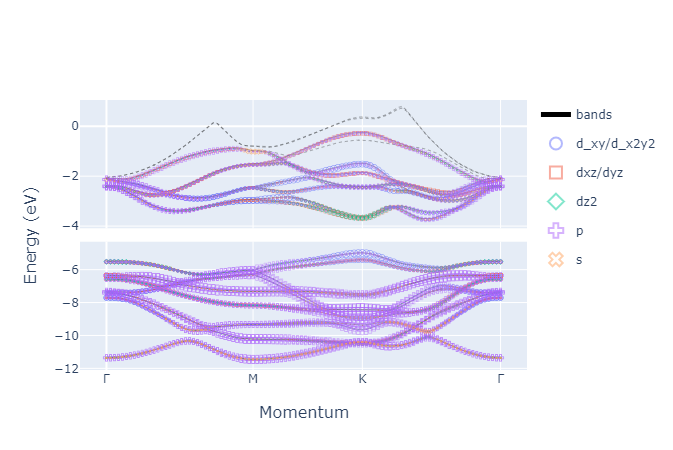

In [6]:
args1_dic = dict(args_1=[dict(l=2, m_l=[2, -2]), dict(l=2, m_l=[1, -1]), dict(l=2, m_l=0), dict(l=1), dict(l=0)])
args2_dic = dict(args_2=[dict(m_s=0.5), dict(m_s=-0.5)])
PROJWFC.plot(
    dis_min=-8,
    dis_max= -2.5,
    cut=-4,
    k_tags=['Γ', 'M', 'K', 'Γ'], 
    k_list=[(0, 0, 0), (0.5, 0, 0), (1/3, 1/3, 0), (0, 0, 0)], 
    N_k=100,
    legend=dict(args=args1_dic, tags=['d_xy/d_x2y2', 'dxz/dyz', 'dz2', 'p', 's'], autocolor=True, autosymbol=True),
    size=10, reset_color=True, ε_margin=2, α=0.5, print_N_wan=False)

One observation we can make from the `projwfc` results is that we have no spin splitting of the conduction band. The K point counts two valence bands:

* The top band consists primarily of two orbitals: $|j=2.5, l=2, m_j=2.5\rangle$ and $|j=2.5, l=2, m_j=-2.5\rangle$ which necessarily corresponds to $|l=2, m_l=2, m_s=0.5\rangle$ and $|l=2, m_l=-2, m_s=-0.5\rangle$. 
* The lower band consists of two other orbitals: $|j=1.5, l=2, m_j=1.5\rangle$ and $|j=1.5, l=2, m_j=-1.5\rangle$ which correspond approximately to $|l=2, m_l=2, m_s=-0.5\rangle$ and $|l=2, m_l=-2, m_s=0.5\rangle$.

Expressing the SOC in terms of the total angular momentum this splitting makes sense:

$$
    \mathbf L\cdot\mathbf S = \frac12(\mathbf J^2 - \mathbf L^2 - \mathbf S^2),
$$ (soc splitting)

which tells us the splitting comes from $j$ and not $m_s$. 

### Wannierization

We attempt to wannierize the bands with the same basis as the three band model. The process is not as straightforward as for graphene. Near the M point in the conduction band an unfortunate crossing creates a discontinuity in the bandstructure. On top of this the valence bands come together at the $\Gamma$ point making it difficult to set a flat window in which the desired Wannier bands fall. 


```{figure} logo.png
---
height: 0px
name: wse2_w90
figclass: margin
---
QE and W90 bands with the NNN TB Hamiltonian. 
```

In [61]:
W90 = wse2.prepare_w90(dict(wannier_plot=True, num_wann=6, num_iter=2000, spinors=True, restart='wannierise'))
orbitals = wse2.wannier_orbitals('orbitals')
W90.set_window(-15, 0, -5.9, -2.75, 1000)

write_w90 = 0
run_w90 = 0
pp = 0
extract_orbitals = 0

if write_w90:
    W90.write()
if run_w90:
    W90.run(pp=pp)
    W90.extract()
if extract_orbitals:
    orbitals.extract()

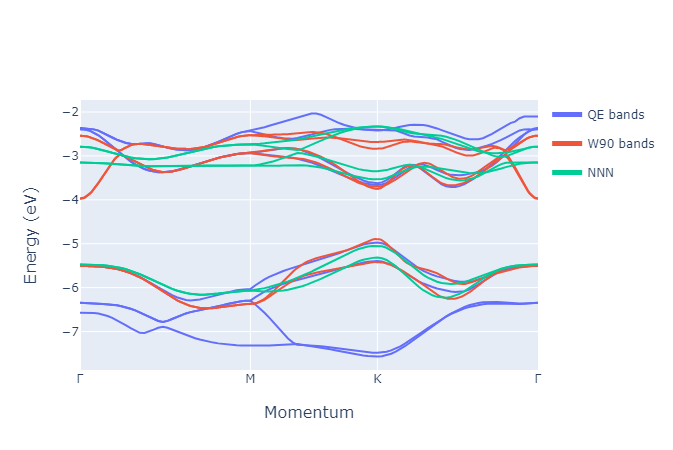

In [8]:
bs = QE.plot_bands(plot_range=[-8, -2])
W90.plot_bands(bs=bs)
bs.plot_from_H(H=W90.create_H(6, print_N=False), name='NNN')
bs.fig

The NNN TB Hamiltonian in {numref}`wse2_w90` matches the valence band well but it struggles to capture the nature of the conduction bands. We must conclude that the three chosen d orbital projections only suffice to explain the K point and the top two valence bands.

```{figure} logo.png
---
height: 0px
name: wse2_wannier
figclass: margin
---
Wannier orbitals constructed from the projected d orbitals. We only plot the absolute value of the Wannier orbitals since it is not possible to construct scalar Wannier orbitals from Bloch functions with SOC.
```

In [9]:
orbitals.plot(step=2, visibility='legendonly')

The Wannier orbitals in {numref}`wse2_wannier` closely resemble three d$_{z^2}$ orbitals in the $xy$ plane at rotations of $2\pi/3$. The orbitals shy away from the selenide atoms and are slightly lobsided.

## Bilayer

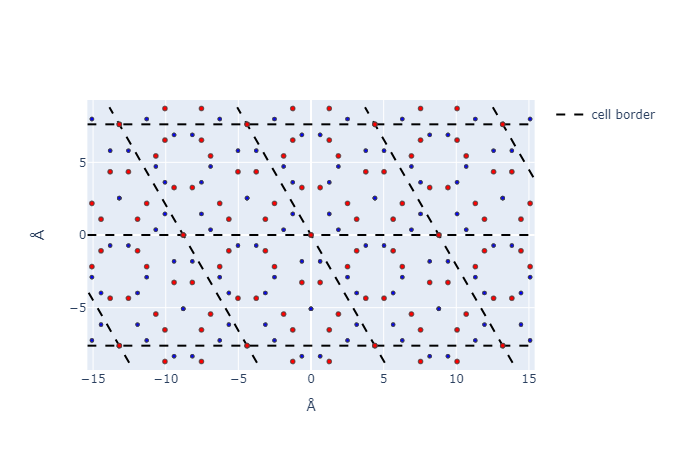

In [13]:
from moire.lattice import Lattice, Bilayer, Supercell

m, n = 2, 1
Δz = 6.8
σ = 1

lattice_1 = Lattice(3.325)
lattice_1.set_atom(np.array([0, 0, 0]), W_dic)
lattice_1.set_atom(np.array([0, 1.919689645, 1.67871166]), Se_dic)
lattice_1.set_atom(np.array([0, 1.919689645, -1.67871166]), Se_dic)
layer_1 = Supercell(lattice_1, m , n)

lattice_2 = Lattice(3.325)
lattice_2.set_atom(np.array([0, 0, Δz]), W_dic)
lattice_2.set_atom(np.array([0, σ*1.919689645, Δz+1.67871166]), Se_dic)
lattice_2.set_atom(np.array([0, σ*1.919689645, Δz-1.67871166]), Se_dic)
layer_2 = Supercell(lattice_2, n, m)

bilayer = Bilayer(layer_1, layer_2)

In [38]:
work_dir = '/home/hidde/hidde/Unige/dft/tbwse2_21'
data_dir = '/home/hidde/hidde/Unige/Hidde-Dijkstra.github.io/dft_data/'
tbwse2_21 = DFT('tbwse2_21', work_dir, data_dir)

control_dic = dict(pseudo_dir='../')
system_dic = dict(occupations='fixed',  ecutwfc=30, nbnd=400, lspinorb=True, noncolin=True)
QE = tbwse2_21.prepare_qe({'&CONTROL': control_dic, '&SYSTEM': system_dic}, bilayer)
PROJWFC = tbwse2_21.prepare_projwfc('projwfc')
tbwse2_21.set_k_grid(8)
tbwse2_21.set_k_path([(0, 0, 0), (0.5, 0, 0), (1/3, 1/3, 0), (0, 0, 0)], ["Γ", "M", "K", "Γ"], 100)

In [34]:
write_qe = 0
run_scf = 0
run_bands = 0
run_nscf = 0
projwfc = 0

if write_qe:
    for file_type in ['scf', 'nscf', 'bands']:
        QE.write(file_type)
if run_scf:
    QE.run('scf')
if run_bands:
    QE.run('bands')
    QE.extract(task='bands')
if run_nscf:
    QE.run('nscf')
if projwfc:
    PROJWFC.write()
    #PROJWFC.run()
    PROJWFC.extract()

['atoms', 'l', 'j', 'm_j']


In [55]:
layer_1 = [i for i in range(7)] + [14 + i for i in range(14)]
layer_2 = [7 + i for i in range(7)] + [28 + i for i in range(14)]

args1_dic = dict(args_1=[dict(l=2, m_l=[2, -2]), dict(l=2, m_l=[1, -1]), dict(l=2, m_l=0), dict(l=1), dict(l=0)])
args2_dic = dict(args_2=[dict(atoms=layer, m_s=m_s) for layer in [layer_1, layer_2] for m_s in [-0.5, 0.5]])
legend_tags = ['layer '+str(i)+' '+σ for i in [1, 2] for σ in ['↓', '↑']]

PROJWFC.plot(
    dis_min=-8,
    dis_max= -2.5,
    cut=-4,
    k_tags=['Γ', 'M', 'K', 'Γ'], 
    k_list=[(0, 0, 0), (0.5, 0, 0), (1/3, 1/3, 0), (0, 0, 0)],
    N_k=[40, 20, 40],
    legend=dict(args=args2_dic, tags=legend_tags, auto_color=True, auto_symbol=True), 
    slider=dict(
        args=args1_dic, 
        tags=['d_xy/d_x2y2', 'dxz/dyz', 'dz2', 'p', 's'], 
        prefix='orbital'), 
    size=10, reset_color=True, ε_margin=2, α=0.5, print_N_wan=False)

IndexError: index 88 is out of bounds for axis 1 with size 88

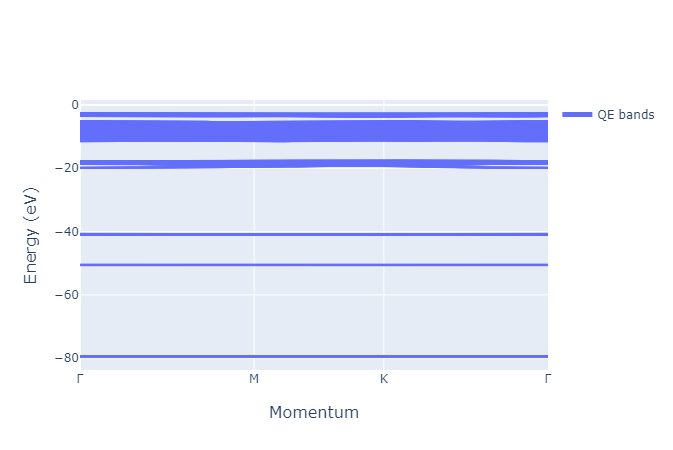

In [52]:
band_plot = QE.plot_bands(reset_color=True, plot_range=[-100, 0], ε_margin=25, α=0.7)
band_plot.fig

In [57]:
np.load('tbwse2_21/qe_bands.npy')[0].shape

(101,)

In [29]:
import os
os.getcwd()

'/home/hidde/hidde/Unige/Hidde-Dijkstra.github.io/dft_data'

In [64]:
W90 = tbwse2_21.prepare_w90(dict(wannier_plot=True, num_wann=84, num_iter=2000, spinors=True, restart='wannierise'))
W90.set_window(-12, 1, -6, -2.7, 1000)

write_w90 = 0
run_w90 = 0
pp = 0
extract_orbitals = 0

if write_w90:
    W90.write()
if run_w90:
    #W90.run(pp=pp)
    W90.extract()

[array([-0.14285714,  0.74230749,  4.31716   ]), array([-0.14285714,  0.74230749,  4.317161  ]), array([-0.07142857,  0.37115374,  4.317323  ]), array([-0.07142857,  0.37115374,  4.317324  ]), array([0.21428571, 0.61858957, 4.31414   ]), array([0.21428571, 0.61858957, 4.31414   ]), array([0.      , 0.      , 4.356038]), array([0.      , 0.      , 4.356038]), array([0.28571429, 0.24743583, 4.284166  ]), array([0.28571429, 0.24743583, 4.284165  ]), array([0.57142857, 0.49487166, 4.281565  ]), array([0.57142857, 0.49487166, 4.281565  ]), array([0.64285714, 0.12371791, 4.282464  ]), array([0.64285714, 0.12371791, 4.282464  ]), array([0.71428571, 0.24743583, 4.295053  ]), array([0.71428571, 0.24743583, 4.295053  ]), array([0.35714286, 0.12371791, 4.29478   ]), array([0.35714286, 0.12371791, 4.29478   ]), array([0.      , 0.      , 4.346492]), array([0.      , 0.      , 4.346492]), array([0.42857143, 0.49487166, 4.292896  ]), array([0.42857143, 0.49487166, 4.292896  ]), array([0.07142857, 0.

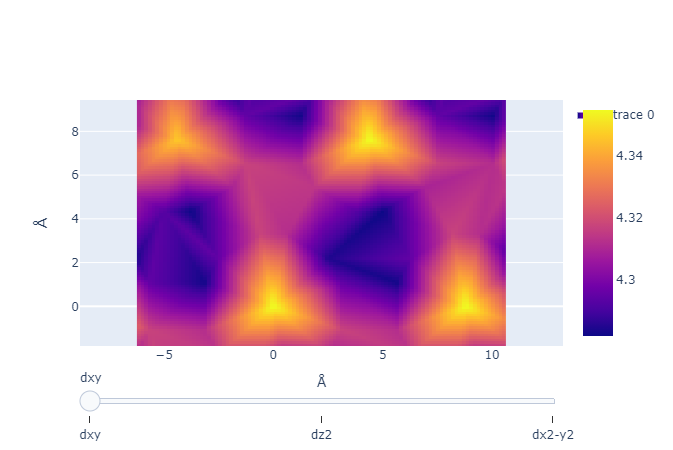

In [65]:
W90.plot_potential()